In [6]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")

In [10]:
ad = sc.read_h5ad('../data/mtDNA_DSB_5k_clustered_LLM_anno.h5ad')

In [13]:
ad.X.max()

3.894839

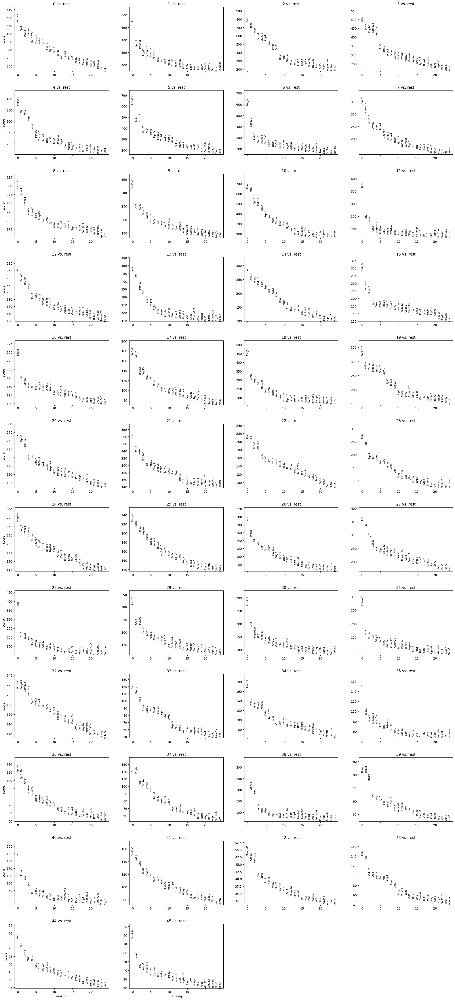

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,Slc1a3,474.107880,2.906861,0.0,0.0
1,0,Gja1,418.784973,3.016683,0.0,0.0
2,0,Plpp3,385.859314,3.069435,0.0,0.0
3,0,Gpr37l1,381.791138,3.026930,0.0,0.0
4,0,Fam107a,348.500488,2.188399,0.0,0.0


In [12]:
# --- Find marker genes per cluster ---
sc.tl.rank_genes_groups(ad, groupby="leiden_2", method="t-test")
sc.pl.rank_genes_groups(ad, n_genes=25, sharey=False)

# get a tidy table of top markers
markers = sc.get.rank_genes_groups_df(ad, group=None)
markers.head()

In [15]:
marker_genes = pd.DataFrame({
    group: ad.uns['rank_genes_groups']['names'][group][:20]
    for group in ad.uns['rank_genes_groups']['names'].dtype.names
})
for col in marker_genes.columns: 
    print(col)
    genes = marker_genes[col].tolist()
    print(" ".join(genes))
    print(' ')

0
Slc1a3 Gja1 Plpp3 Gpr37l1 Fam107a Atp1b2 Aldoc Fgfr3 S1pr1 Ttyh1 Ntsr2 Ptprz1 Mt2 Gnao1 Gjb6 Luzp2 Appl2 Acsl6 Cspg5 Msmo1
 
1
Pltp Epas1 Selenop Adgrf5 Slc9a3r2 Abcb1a Slc2a1 B2m Flt1 Itih5 Podxl Cxcl12 Abcg2 Pecam1 H2-D1 Cdh5 Egfl7 Fn1 Eng Esam
 
2
Cnp Ptgds Mbp Sept4 Cldn11 Aplp1 Mal Ermn Car2 Qdpr Mog Stmn4 Mag Bin1 Rnf13 Cryab Ugt8a Gprc5b Slc12a2 Apod
 
3
Gnal Gpr88 Ppp1r1b Camk2b Pde10a Pde1b Rgs9 Ptpn5 Scn4b Camkv Slc32a1 Ywhaz Meis2 Camk4 Baiap2 Eno2 Ppp3r1 Ndrg4 Rap1gap Cyld
 
4
Impact Ahi1 Meg3 Peg3 Gap43 Minar2 Zcchc12 Stxbp1 Ndn Uchl1 Hap1 Prkar1a Disp2 Eno2 Map1b Rasgrf1 Prkaca Stmn2 Grb10 Rab3a
 
5
Slc6a11 Gja1 Atp1b2 Gpr37l1 Ntsr2 Fgfr3 Plpp3 Slc1a3 Ttyh1 Aldoc Ndrg2 Gjb6 Selenop Ptprz1 Ntrk2 Mt2 Ckb Acsl6 Etnppl S1pr1
 
6
Meg3 Snap25 Stxbp1 Cabp1 Atp2b2 Slc17a7 Gria2 Sncb Cyfip2 Dnm1 Camk2b Lingo1 Gabra1 Grin1 Adgrb1 Ppp3r1 Hivep2 Grin2a Syn1 Camk2a
 
7
Snap25 Camk2a Atp2b2 Cyfip2 Cabp1 Stxbp1 Slc17a7 Lingo1 Gabra1 Sncb Ppp3r1 Ywhaz Camk2b Sept5 Syn1 Pak1 Stx1a Dnm1 

In [20]:
annotation = {
    '0': 'Telencephalon astrocytes I',
    '1': 'Pericytes I',
    '2': 'Mature oligodendrocytes I',
    '3': 'Striatal neurons I',
    '4': 'Neurons I',
    '5': 'Olfactory astrocytes I',
    '6': 'Excitatory neurons I',
    '7': 'Excitatory neurons II',
    '8': 'Excitatory neurons (cortex) I',
    '9': 'Inhibitory neurons I',
    '10': 'Mature oligodendrocytes II',
    '11': 'Vascular leptomeningeal cells I',
    '12': 'Inhibitory neurons II',
    '13': 'Microglia I',
    '14': 'Mature oligodendrocytes III',
    '15': 'Excitatory neurons III',
    '16': 'Vascular endothelial cells I',
    '17': 'Neurons II',
    '18': 'Excitatory neurons (thalamus) I',
    '19': 'Excitatory neurons (cortex) II',
    '20': 'Oligodendrocytes precursor cells I',
    '21': 'Excitatory neurons (thalamus) II',
    '22': 'Telencephalon astrocytes II',
    '23': 'Mature oligodendrocytes IV',
    '24': 'Excitatory neurons IV',
    '25': 'Excitatory neurons V',
    '26': 'Mature oligodendrocytes V',
    '27': 'Chorid plexus epithelial cells I',
    '28': 'Ependymal cells I',
    '29': 'Excitatory neurons VI',
    '30': 'Cholinergic neurons I',
    '31': 'Excitatory neurons VII',
    '32': 'Excitatory neurons (cortex) III',
    '33': 'Mature oligodendrocytes VI',
    '34': 'Olfactory astrocytes II',
    '35': 'Vascular endothelial cells II',
    '36': 'D1 medium spiny neurons (striatum) I',
    '37': 'Mature oligodendrocytes VII',
    '38': 'Mature oligodendrocytes VIII',
    '39': 'Endothelial cells I',
    '40': 'Unknown',
    '41': 'Inhibitory neurons III',
    '42': 'Neural progenitors I',
    '43': 'Mature oligodendrocytes (mic) I',
    '44': 'Unknown',
    '45': 'Unknown'
}
# Strip roman numerals automatically
import re
annotation_base = {k: re.sub(r"\s+[IVXLCDM]+$", "", v) for k, v in annotation.items()}

In [22]:
ad.obs['cell_type'] = ad.obs.leiden_2.map(annotation)
ad.obs['cell_class'] = ad.obs.leiden_2.map(annotation_base)

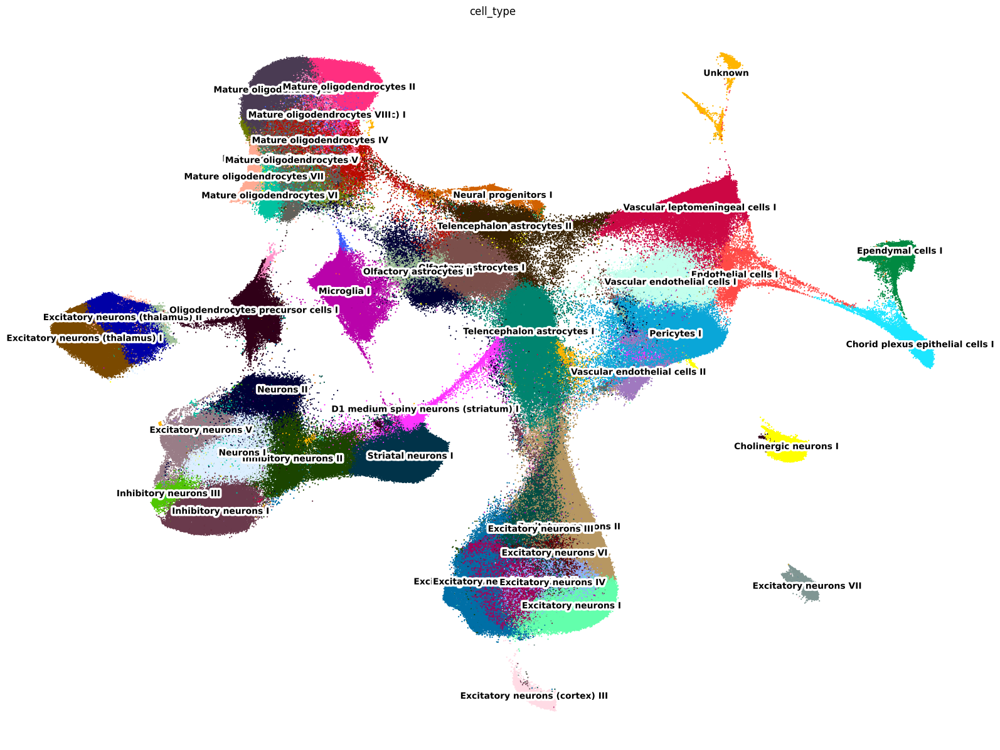

In [32]:
import matplotlib.pyplot as plt

with plt.rc_context({"figure.figsize": (20, 15)}):
    sc.pl.umap(
        ad,
        color="cell_type",
        legend_loc="on data",
        frameon=False,
        legend_fontoutline = 5,
        size=10
    )

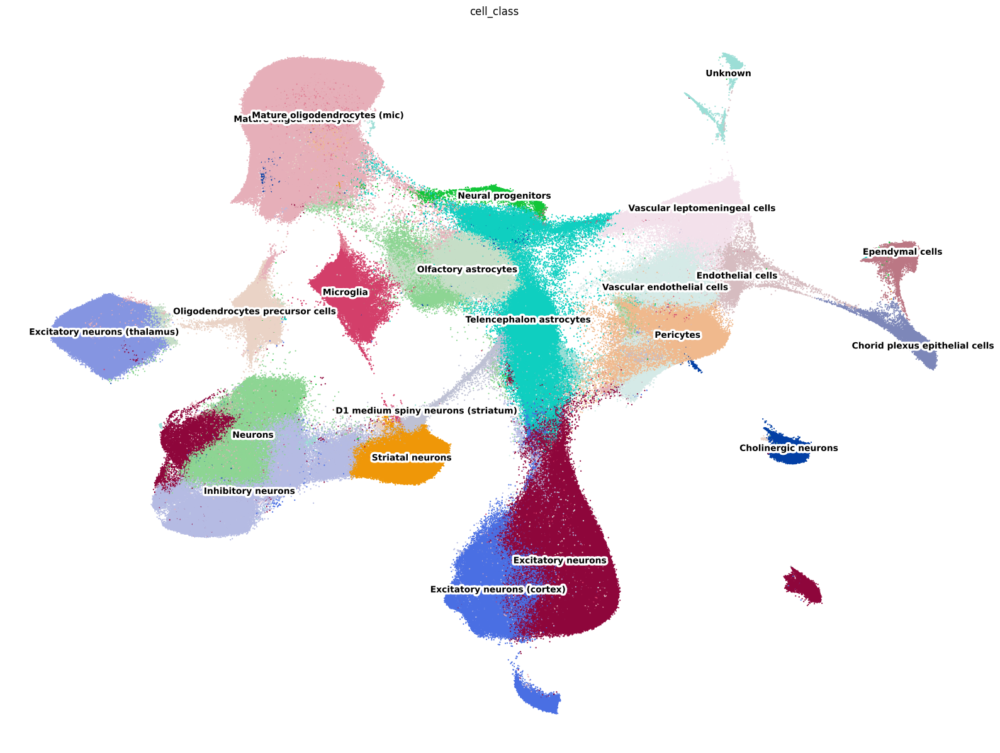

In [33]:
import matplotlib.pyplot as plt

with plt.rc_context({"figure.figsize": (20, 15)}):
    sc.pl.umap(
        ad,
        color="cell_class",
        legend_loc="on data",
        frameon=False,
        legend_fontoutline = 5,
        size=10
    )

output-XETG00045__0060539__RB4282__20250917__105852


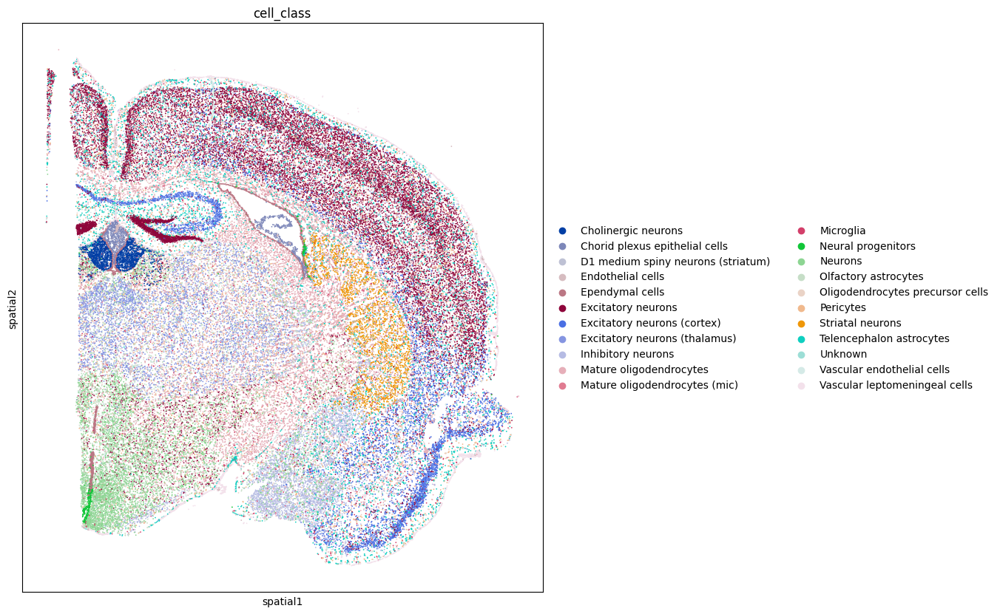

output-XETG00045__0060539__RB4350__20250917__105852


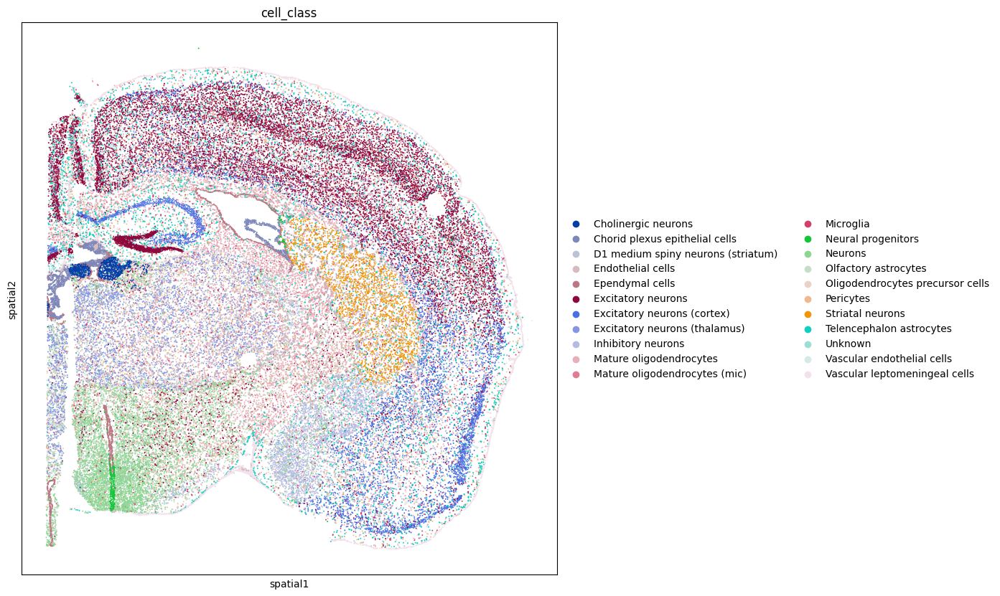

output-XETG00045__0060539__RB4401__20250917__105852


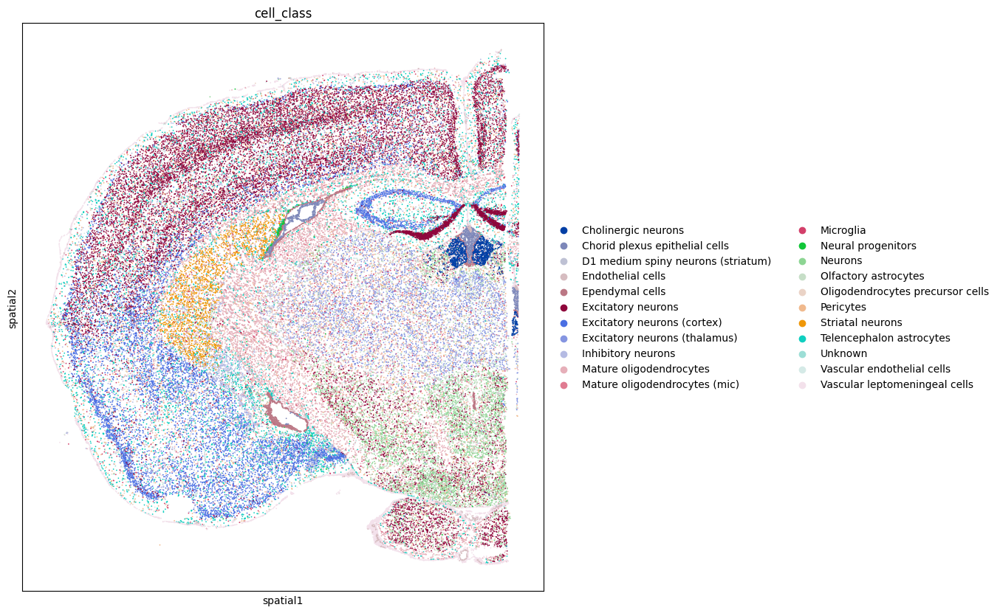

output-XETG00045__0060539__RB4403__20250917__105852


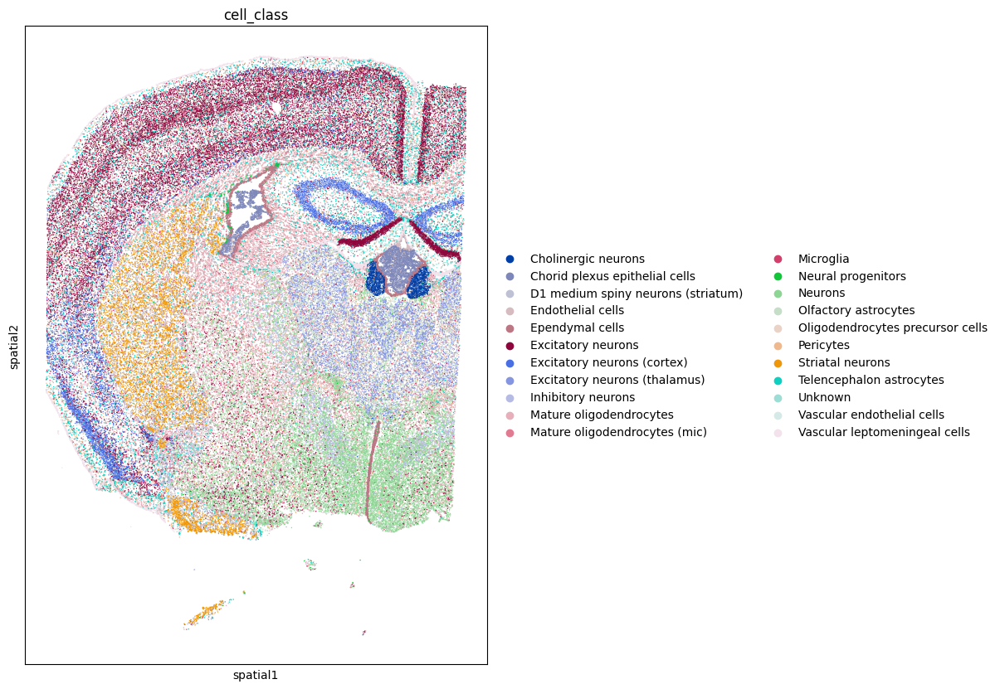

output-XETG00045__0060539__RB4405__20250917__105852


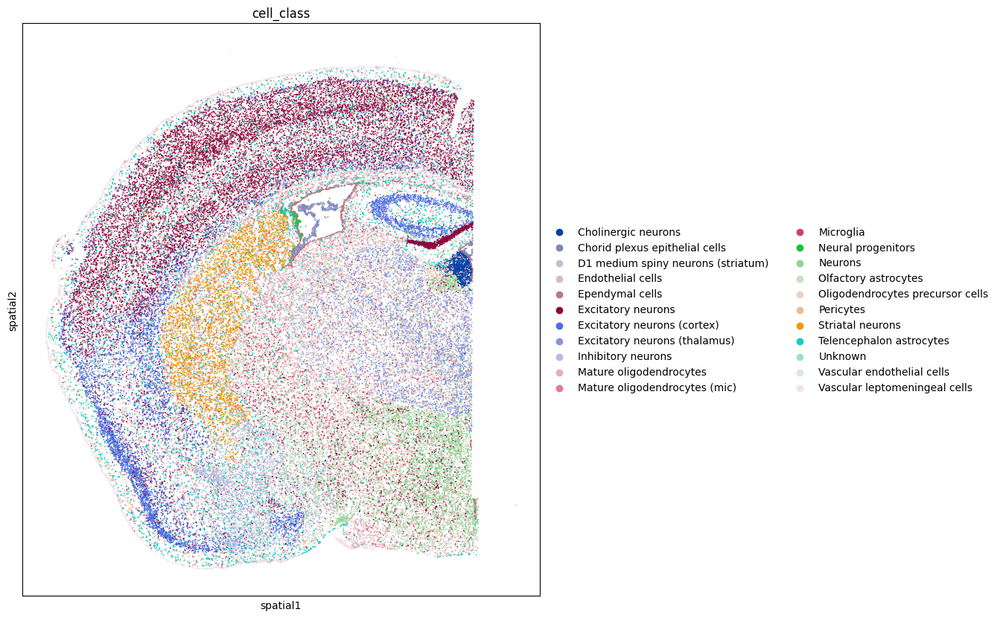

output-XETG00045__0060539__RB4498__20250917__105852


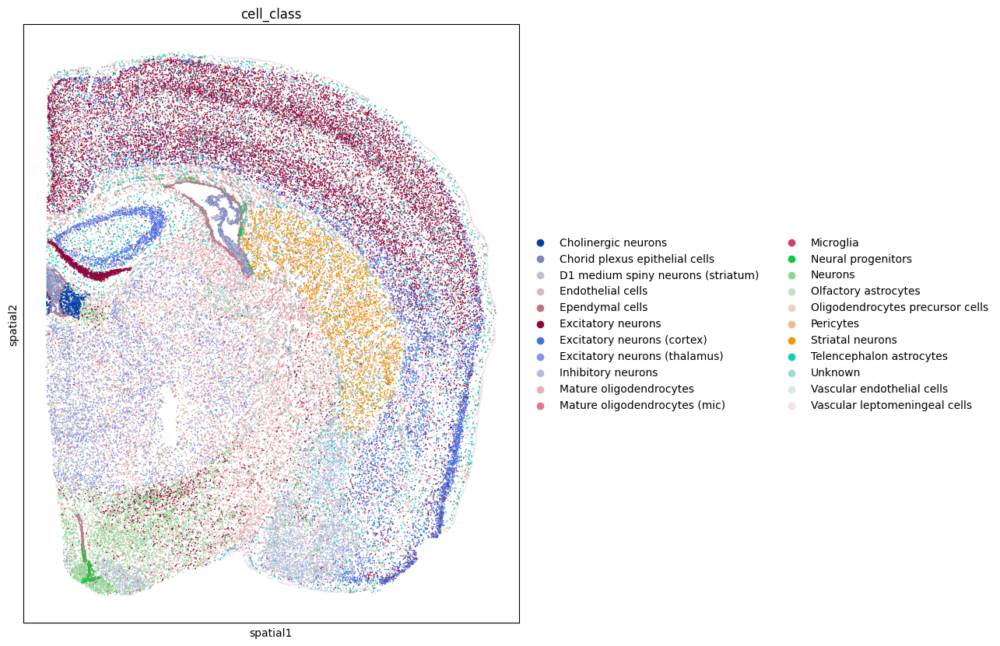

output-XETG00045__0060541__RB4620__20250917__105852


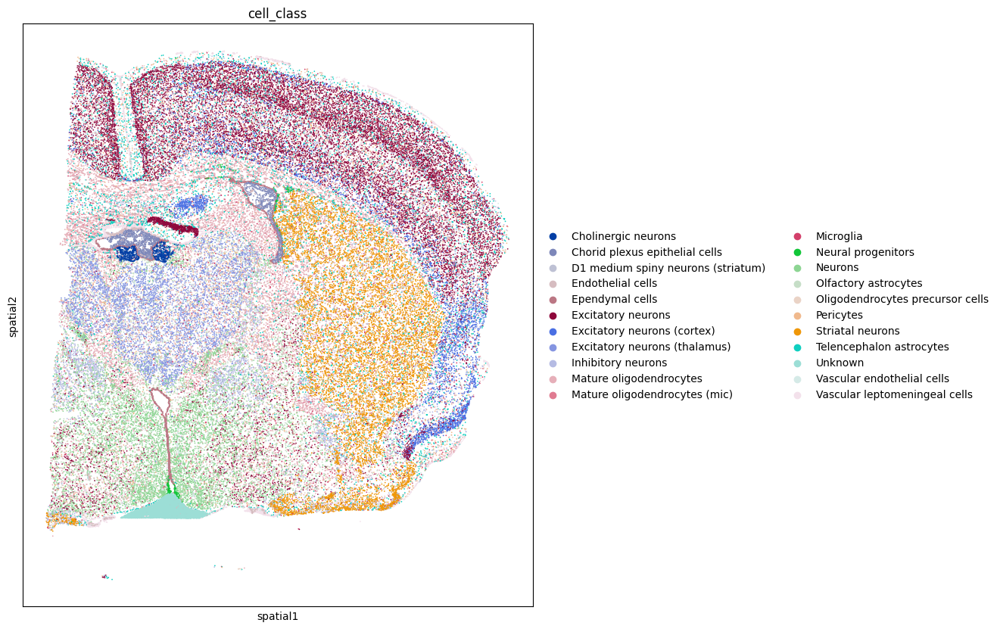

output-XETG00045__0060541__RB4627__20250917__105852


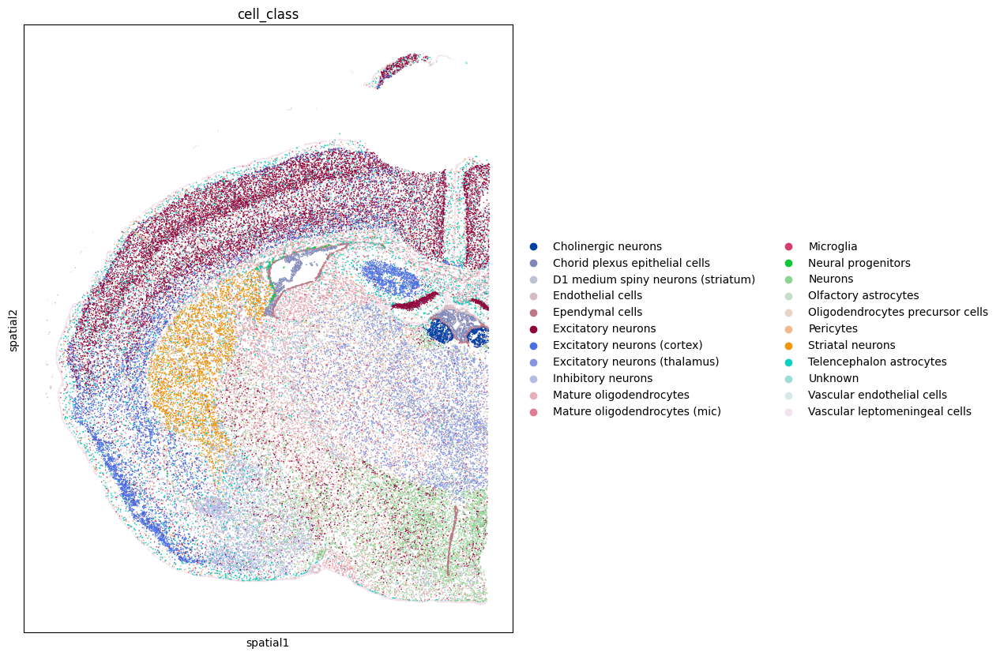

output-XETG00045__0060541__RB4630__20250917__105852


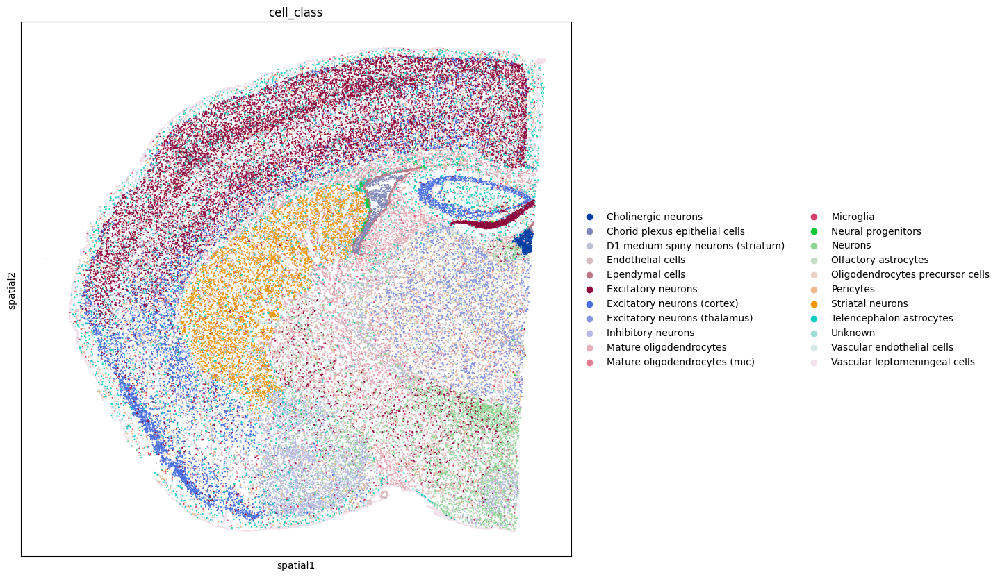

output-XETG00045__0060541__RB4653__20250917__105852


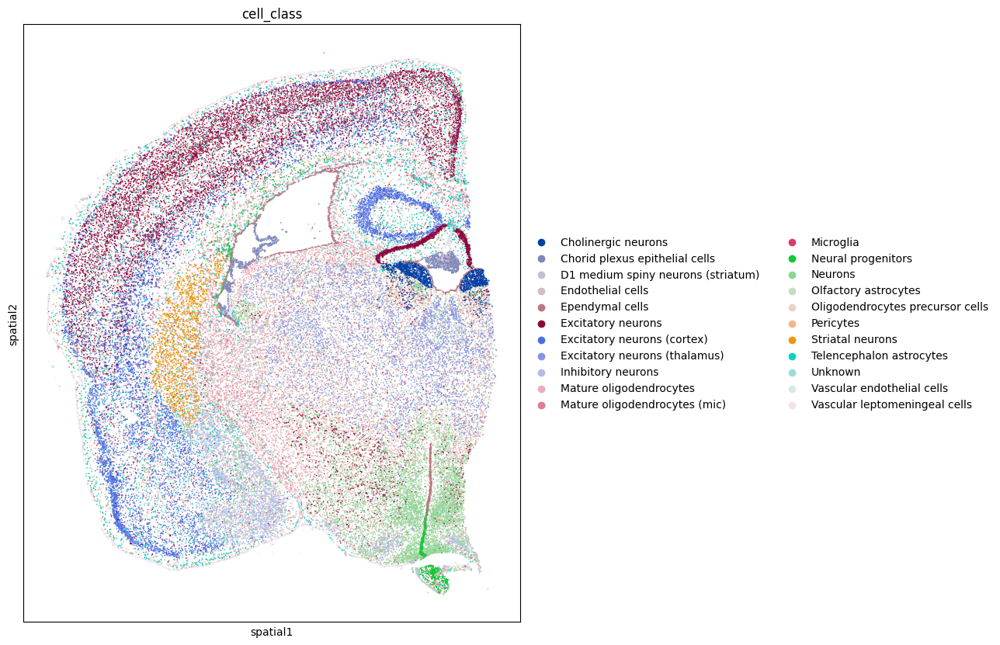

output-XETG00045__0060541__RB4658__20250917__105852


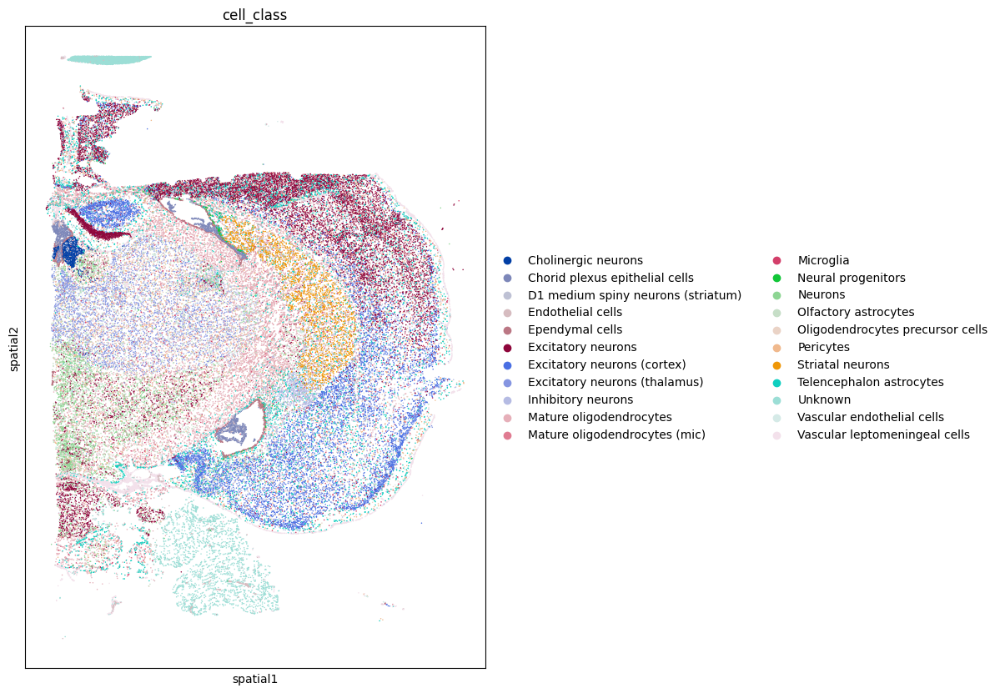

output-XETG00045__0060541__RB4676__20250917__105852


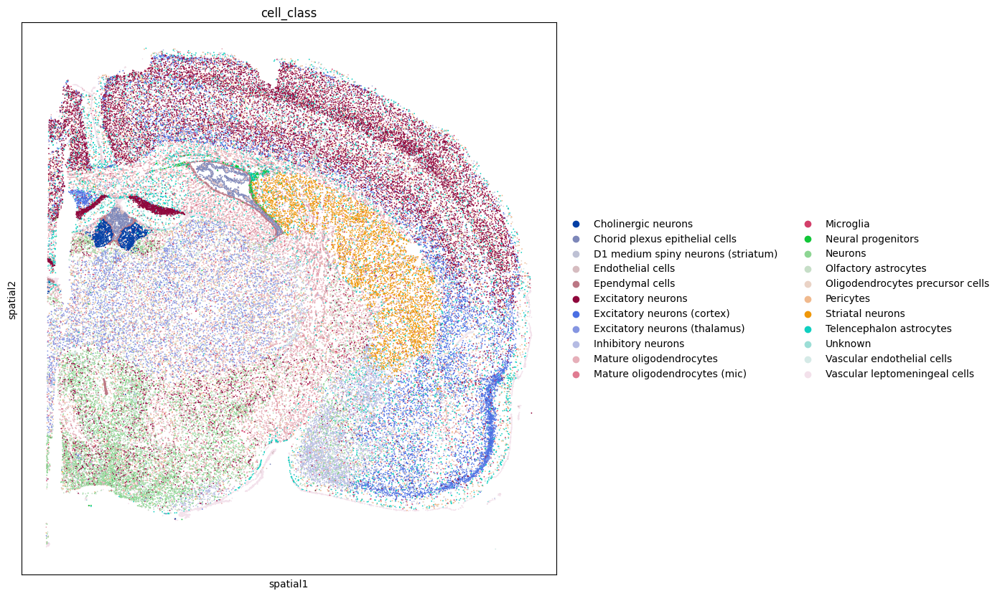

In [38]:
for run in ad.obs['run'].unique():
    print(run)
    ad_int = ad[ad.obs['run'] == run]
    with plt.rc_context({'figure.figsize': (20, 10)}):
        sc.pl.spatial(ad_int, spot_size=15, color = 'cell_class')
    plt.show()
    

In [44]:
ad.write('../data/mtDNA_DSB_5k_clustered_manual_annotation.h5ad')